# Project Description
Data Description:  The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars. Domain:  Object recognition Context: The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles. Attribute Information: ● All the features are geometric features extracted from the silhouette.  ● All are numeric in nature. 
 
Learning Outcomes:  ● Exploratory Data Analysis ● Reduce number dimensions in the dataset with minimal information loss ● Train a model using Principal Components 
 
Objective:  Apply dimensionality reduction technique – PCA and train a model using principal components instead of training the model using raw data. 

In [1]:
#importing some necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
dataset = pd.read_csv('vehicle.csv')

In [3]:
dataset.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [4]:
dataset.shape

(846, 19)

In [5]:
dataset.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


In [6]:
dataset.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [7]:
# Finding number of records for each unique target variable values. Note the target variable is class
dataset['class'].value_counts()

car    429
bus    218
van    199
Name: class, dtype: int64

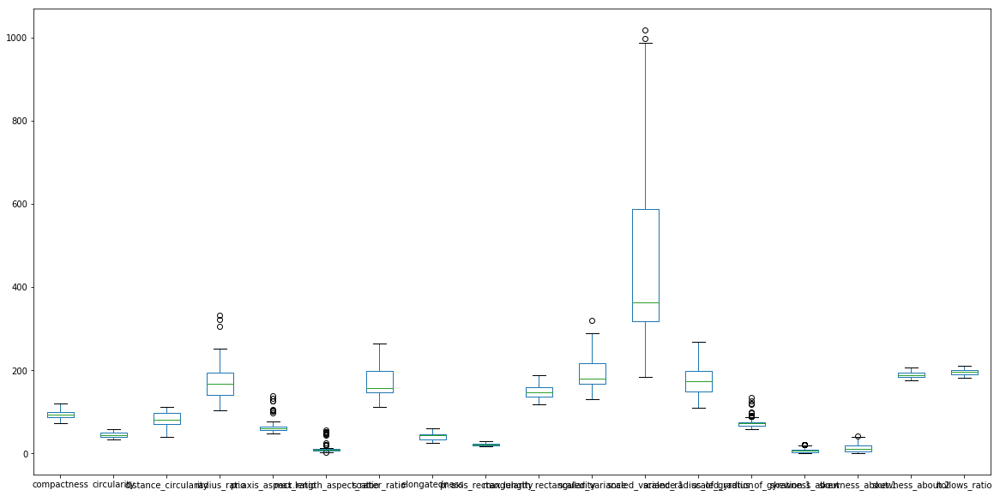

In [8]:
#Boxplot to understand spread and outliers
dataset.plot(kind='box', figsize=(20,10))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001EDE6E11470>,
      dtype=object)

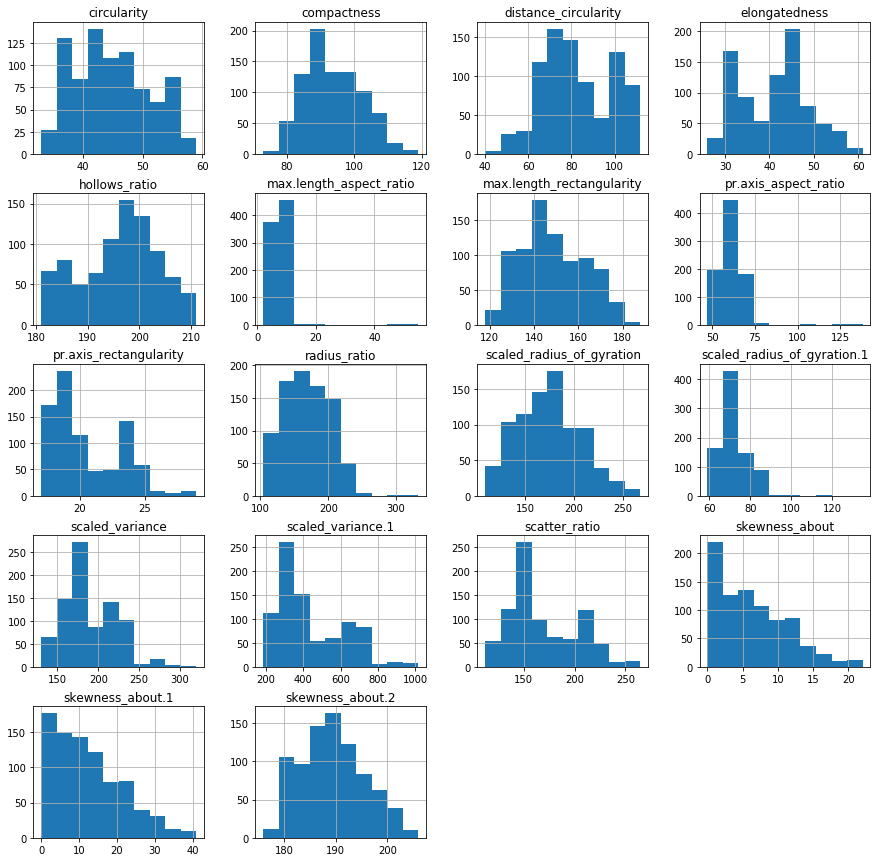

In [9]:
dataset.hist(figsize=(15,15))

In [10]:
# Checking for null values in all the attributes
dataset.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [11]:
#Replace missing values by median of column value as their are many outliers otherwise we would replace it with means
for i in dataset.columns[:17]:
    median_value = dataset[i].median()
    dataset[i] = dataset[i].fillna(median_value)

In [12]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
compactness                    846 non-null int64
circularity                    846 non-null float64
distance_circularity           846 non-null float64
radius_ratio                   846 non-null float64
pr.axis_aspect_ratio           846 non-null float64
max.length_aspect_ratio        846 non-null int64
scatter_ratio                  846 non-null float64
elongatedness                  846 non-null float64
pr.axis_rectangularity         846 non-null float64
max.length_rectangularity      846 non-null int64
scaled_variance                846 non-null float64
scaled_variance.1              846 non-null float64
scaled_radius_of_gyration      846 non-null float64
scaled_radius_of_gyration.1    846 non-null float64
skewness_about                 846 non-null float64
skewness_about.1               846 non-null float64
skewness_about.2               846 non-null float64
hollows_ratio    

In [13]:
# chercking for null values again to ensure there are no null values present
dataset.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

In [14]:
# Identifying the outliers and replacing them with median

for col_name in dataset.columns[:-1]:
    q1 = dataset[col_name].quantile(0.25)
    q3 = dataset[col_name].quantile(0.75)
    iqr = q3 - q1
    
    low = q1-1.5*iqr
    high = q3+1.5*iqr
    
    dataset.loc[(dataset[col_name] < low) | (dataset[col_name] > high), col_name] = dataset[col_name].median()

In [15]:
dataset.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.330969,32.147908,104.0,141.00,167.0,194.75,252.0
pr.axis_aspect_ratio,846.0,61.154846,5.613458,47.0,57.00,61.0,65.00,76.0
max.length_aspect_ratio,846.0,8.118203,2.064114,3.0,7.00,8.0,10.00,13.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


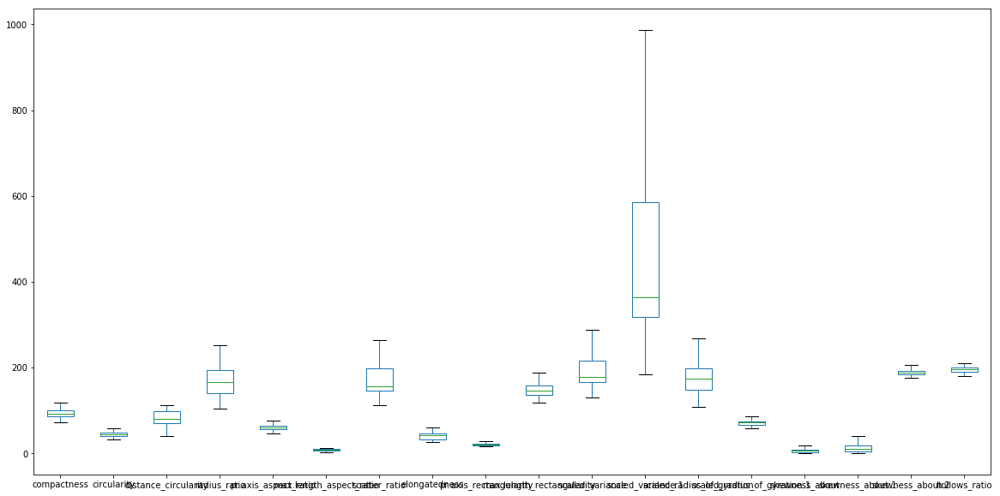

In [16]:
# checking whether outliers fixed or not
dataset.plot(kind='box', figsize=(20,10))

# Studying the dataset using Agglomerative Hierarchical Clustering technique

In [17]:
hdf=dataset.copy()

In [18]:
for feature in hdf.columns: # Loop through all columns in the dataframe
    if hdf[feature].dtype == 'object': # Only apply for columns with categorical strings
        hdf[feature] = pd.Categorical(hdf[feature]).codes # Replace strings with an integer

C:\Users\Asus\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


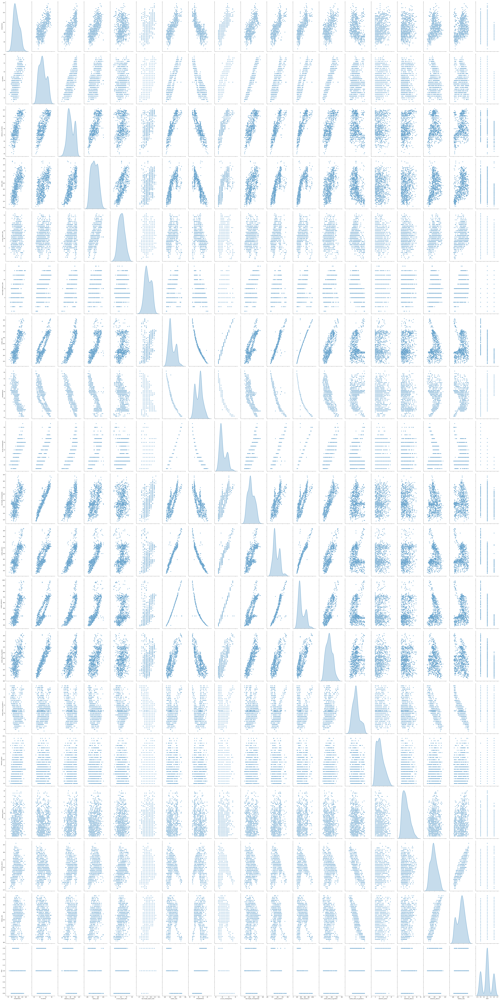

In [19]:
#importing seaborn for statistical plots
import seaborn as sns


sns.pairplot(hdf, size=7,aspect=0.5 , diag_kind='kde')

In [20]:
# From analysing the diagonal panels we can find the number of clusters that can be taken by observing the highest number number of peaks and from off diagonal panels we can choose the distance calculation method that can be used. In this case we choose number of clusters as 3. 

# Distance calculation method used is Manhattan

In [21]:
from sklearn.cluster import AgglomerativeClustering 

model = AgglomerativeClustering(n_clusters=3, affinity='manhattan',  linkage='average')
model.fit(hdf)

AgglomerativeClustering(affinity='manhattan', compute_full_tree='auto',
            connectivity=None, linkage='average', memory=None,
            n_clusters=3, pooling_func='deprecated')

In [22]:
hdf['labels'] = model.labels_

hdf.groupby(["labels"]).count()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
labels,,,,,,,,,,,,,,,,,,,
0,256,256,256,256,256,256,256,256,256,256,256,256,256,256,256,256,256,256,256
1,568,568,568,568,568,568,568,568,568,568,568,568,568,568,568,568,568,568,568
2,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22,22


In [23]:
hdf_clusters = hdf.groupby(['labels'])

In [24]:
print(hdf_clusters)

In [25]:
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage

In [26]:
from scipy.spatial.distance import pdist  #Pairwise distribution between data points

In [27]:
# cophenet index is a measure of the correlation between the distance of points in feature space and distance on dendrogram
# closer it is to 1, the better is the clustering
# using average linkage
Z = linkage(hdf, 'average')
c, coph_dists = cophenet(Z , pdist(hdf))

c

0.8382945923769921

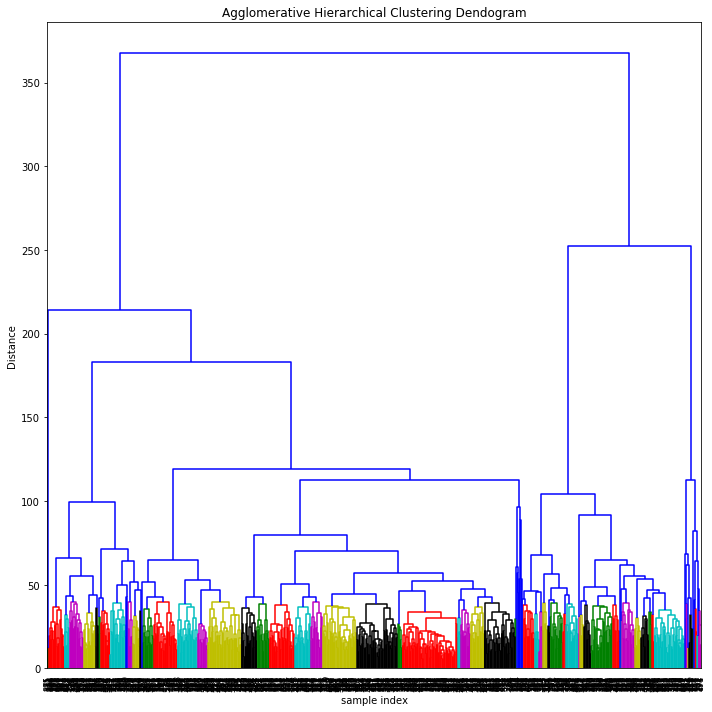

In [28]:
plt.figure(figsize=(10, 10))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90.,color_threshold = 40, leaf_font_size=8. )
plt.tight_layout()

In [29]:
# Using complete linkage
Z = linkage(hdf, 'complete')
c, coph_dists = cophenet(Z , pdist(hdf))

c

0.8001459453856393

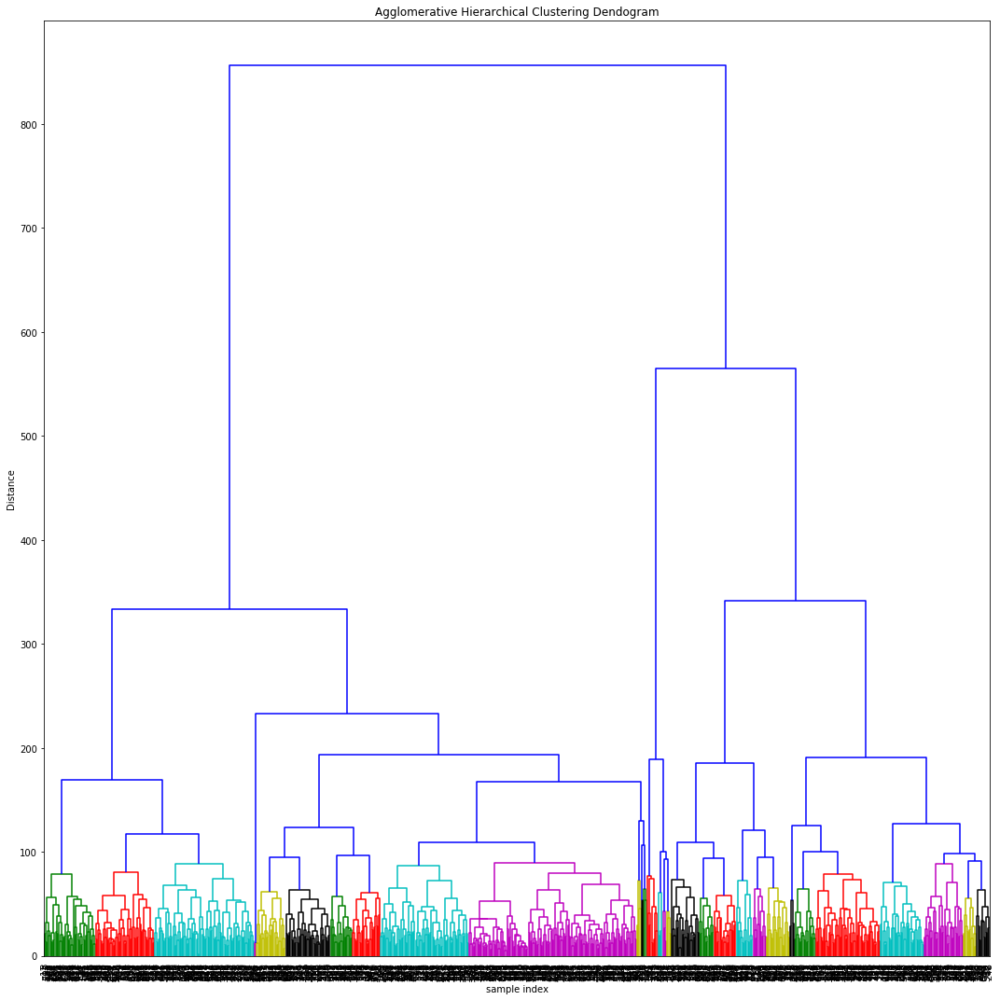

In [30]:
plt.figure(figsize=(15, 15))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90.,color_threshold=90,  leaf_font_size=10. )
plt.tight_layout()

In [31]:
# linkage as ward
Z = linkage(hdf, 'ward')
c, coph_dists = cophenet(Z , pdist(hdf))

c

0.8267438402868998

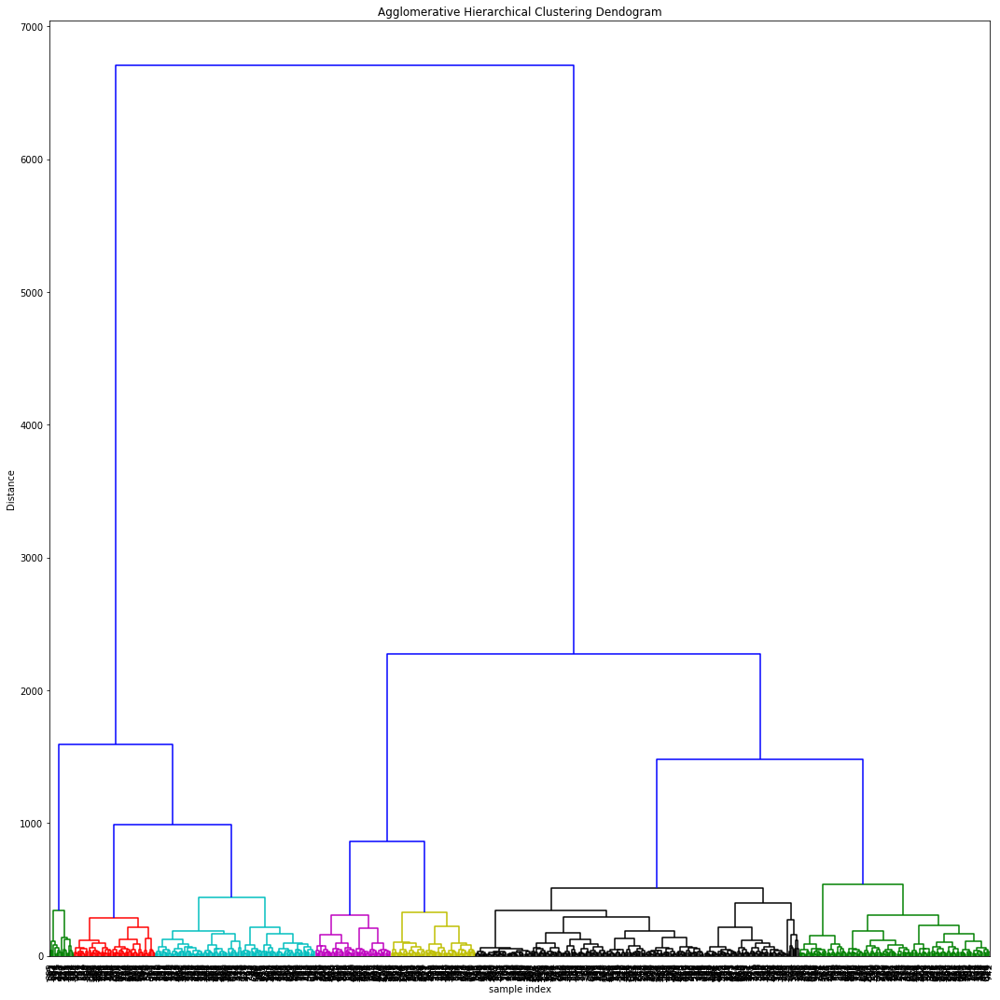

In [32]:
plt.figure(figsize=(15, 15))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90.,color_threshold=600,  leaf_font_size=10. )
plt.tight_layout()

# Distance calculation method used is Euclidean

In [33]:
model = AgglomerativeClustering(n_clusters=3, affinity='euclidean')
model.fit(hdf)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=3,
            pooling_func='deprecated')

In [34]:
hdf['labels'] = model.labels_

hdf.groupby(["labels"]).count()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
labels,,,,,,,,,,,,,,,,,,,
0,239,239,239,239,239,239,239,239,239,239,239,239,239,239,239,239,239,239,239
1,463,463,463,463,463,463,463,463,463,463,463,463,463,463,463,463,463,463,463
2,144,144,144,144,144,144,144,144,144,144,144,144,144,144,144,144,144,144,144


In [35]:
hdf_clusters = hdf.groupby(['labels'])
print(hdf_clusters)

In [36]:
Z = linkage(hdf, 'average')
c, coph_dists = cophenet(Z , pdist(hdf))

c

0.8383000495863547

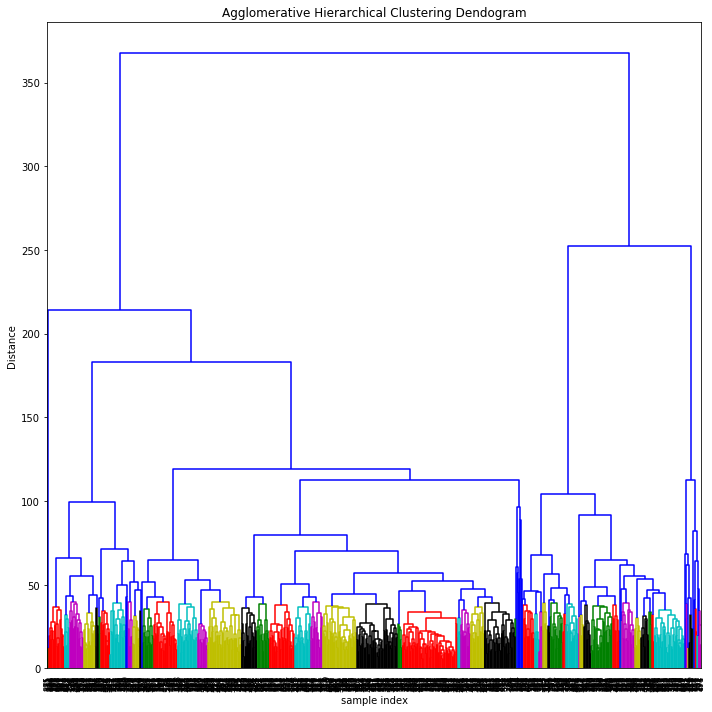

In [37]:
plt.figure(figsize=(10, 10))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90.,color_threshold = 40, leaf_font_size=8. )
plt.tight_layout()

In [38]:
Z = linkage(hdf, 'complete')
c, coph_dists = cophenet(Z , pdist(hdf))

c

0.8001459146545137

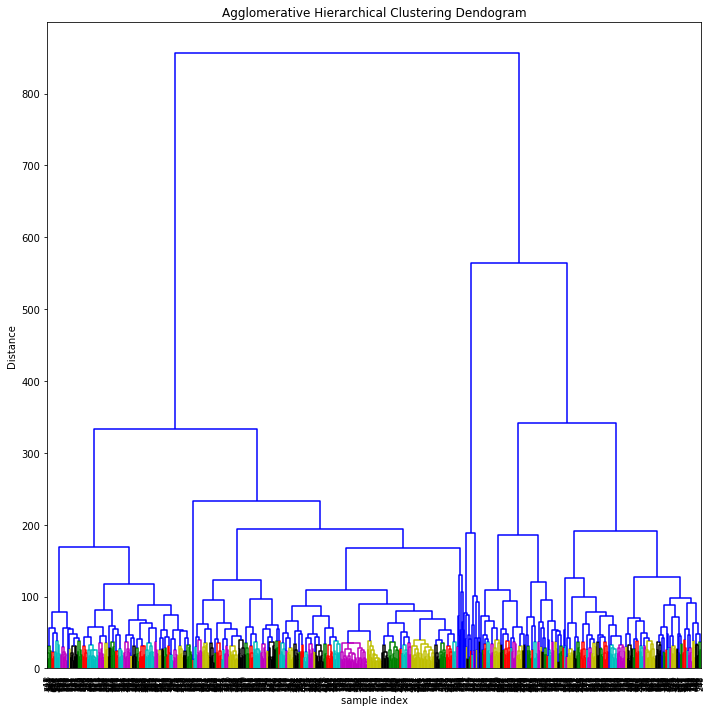

In [39]:
plt.figure(figsize=(10, 10))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90.,color_threshold = 40, leaf_font_size=8. )
plt.tight_layout()

In [40]:
Z = linkage(hdf, 'ward')
c, coph_dists = cophenet(Z , pdist(hdf))

c

0.826751083554093

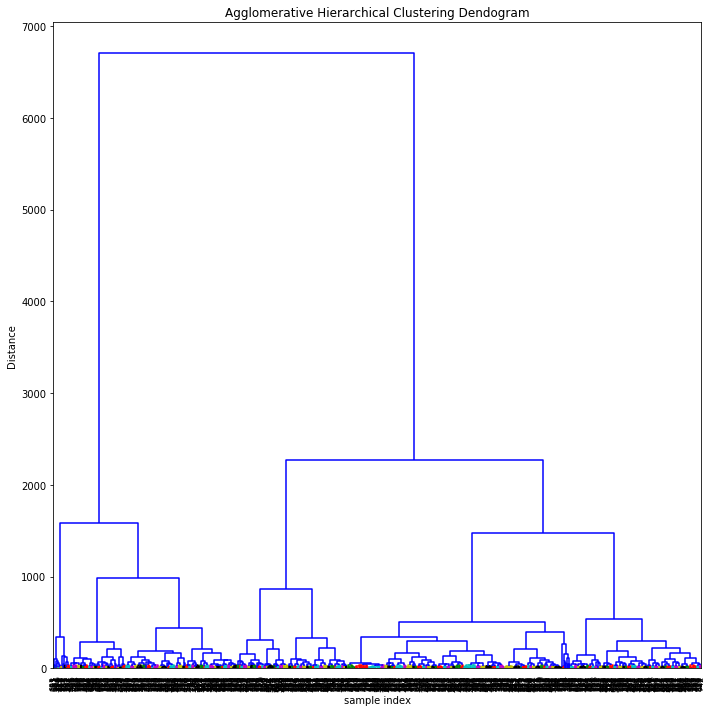

In [41]:
plt.figure(figsize=(10, 10))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90.,color_threshold = 40, leaf_font_size=8. )
plt.tight_layout()

# Principal Component Analysis (PCA)

In [42]:
# Importing necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import zscore

In [43]:
pcdf=dataset.copy()

In [44]:

for feature in pcdf.columns: # Loop through all columns in the dataframe
    if pcdf[feature].dtype == 'object': # Only apply for columns with categorical strings
        pcdf[feature] = pd.Categorical(pcdf[feature]).codes # Replace strings with an integer


In [45]:
pcdf.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95.0,48.0,83.0,178.0,72.0,10.0,162.0,42.0,20.0,159.0,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197.0,2
1,91.0,41.0,84.0,141.0,57.0,9.0,149.0,45.0,19.0,143.0,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199.0,2
2,104.0,50.0,106.0,209.0,66.0,10.0,207.0,32.0,23.0,158.0,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196.0,1
3,93.0,41.0,82.0,159.0,63.0,9.0,144.0,46.0,19.0,143.0,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207.0,2
4,85.0,44.0,70.0,205.0,61.0,8.0,149.0,45.0,19.0,144.0,241.0,325.0,188.0,71.5,9.0,11.0,180.0,183.0,0


In [46]:
# Note bus is replaced with 0 , car with 1 and van with 2 in class column

In [47]:
# separating the target column and the other independent columns
X = pcdf.iloc[:,0:18]
y = pcdf.iloc[:,18]

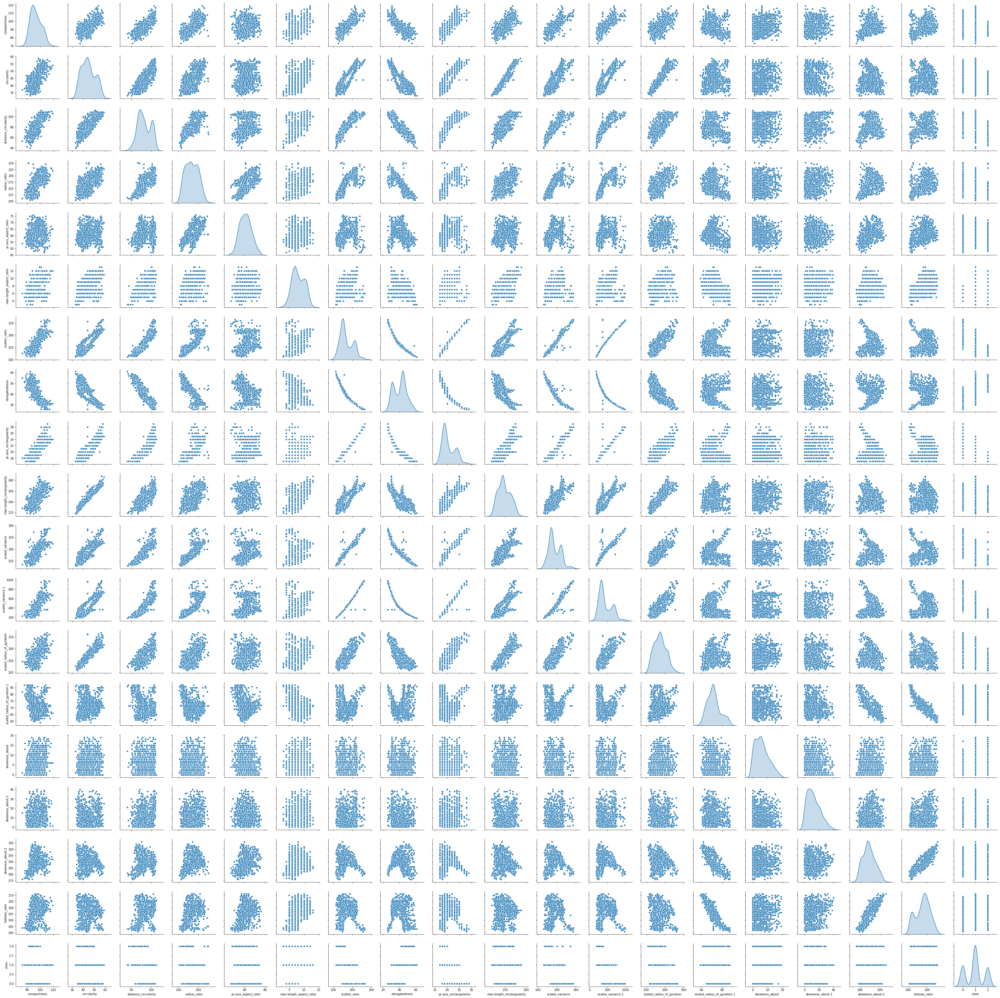

In [48]:
sns.pairplot(pcdf, diag_kind='kde') 

In [50]:
# Note:- From pair plot we see that the independent columns have a strong correlation among them , they are impacting one another which means lot of redundant information will be fed to the model. Hence to overcome redundancy and reduce loss of information we use PCA

In [51]:
# We transform (centralize) the entire X (independent variable data) to zscores through transformation. We will create the PCA dimensions
# on this distribution. 
sc = StandardScaler()
X_std =  sc.fit_transform(X)          
cov_matrix = np.cov(X_std.T)
print('Covariance Matrix \n%s', cov_matrix)

Covariance Matrix 
%s [[ 1.00118343  0.68569786  0.79086299  0.72277977  0.1930925   0.50051942
   0.81358214 -0.78968322  0.81465658  0.67694334  0.77078163  0.80712401
   0.58593517 -0.24697246  0.19754181  0.1565327   0.29889034  0.36598446]
 [ 0.68569786  1.00118343  0.79325751  0.63903532  0.20349327  0.5611334
   0.8489411  -0.82244387  0.84439802  0.96245572  0.80371846  0.82844154
   0.92691166  0.06882659  0.13651201 -0.00967793 -0.10455005  0.04640562]
 [ 0.79086299  0.79325751  1.00118343  0.79516215  0.24462154  0.66759792
   0.90614687 -0.9123854   0.89408198  0.77544391  0.87061349  0.88498924
   0.70660663 -0.22962442  0.09922417  0.26265581  0.14627113  0.33312625]
 [ 0.72277977  0.63903532  0.79516215  1.00118343  0.65132393  0.46450748
   0.77085211 -0.82636872  0.74502008  0.58015378  0.78711387  0.76115704
   0.55142559 -0.39092105  0.03579728  0.17981316  0.40632957  0.49234013]
 [ 0.1930925   0.20349327  0.24462154  0.65132393  1.00118343  0.15047265
   0.19442484

In [52]:
eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)
print('Eigen Vectors \n%s', eigenvectors)
print('\n Eigen Values \n%s', eigenvalues)

Eigen Vectors 
%s [[-2.72502890e-01 -8.70435783e-02  3.81852075e-02  1.38675013e-01
  -1.37101466e-01  2.63611383e-01  2.02717114e-01 -7.58796410e-01
   3.66685918e-01  1.60045219e-01  8.40252779e-02  2.14645175e-02
  -1.87350749e-02  6.89082276e-02  4.26105276e-02  9.97784975e-02
  -8.22590084e-02 -3.30366937e-02]
 [-2.87254690e-01  1.31621757e-01  2.01146908e-01 -3.80554832e-02
   1.38995553e-01 -7.13474241e-02 -3.92275358e-01 -6.76034223e-02
   5.53261885e-02 -1.82323962e-01 -3.65229874e-02  1.47247511e-01
  -4.89102355e-02  5.90534770e-02 -6.74107885e-01  1.63466948e-01
  -2.59100771e-01  2.48832011e-01]
 [-3.02421105e-01 -4.61430061e-02 -6.34621085e-02  1.08954287e-01
   8.00174278e-02 -1.69006151e-02  1.63371282e-01  2.77371950e-01
   7.46784853e-02  2.73033778e-01  4.68505530e-01  6.52730855e-01
   4.74162132e-03 -1.62108150e-01 -4.99754439e-04 -6.36582307e-02
   1.20629778e-01  9.80561531e-02]
 [-2.69713545e-01 -1.97931263e-01 -5.62851689e-02 -2.54355087e-01
  -1.33744367e-01 -

In [53]:
# Step 3 (continued): Sort eigenvalues in descending order

# Make a set of (eigenvalue, eigenvector) pairs
eig_pairs = [(eigenvalues[index], eigenvectors[:,index]) for index in range(len(eigenvalues))]

# Sort the (eigenvalue, eigenvector) pairs from highest to lowest with respect to eigenvalue
eig_pairs.sort()

eig_pairs.reverse()
print(eig_pairs)

# Extract the descending ordered eigenvalues and eigenvectors
eigvalues_sorted = [eig_pairs[index][0] for index in range(len(eigenvalues))]
eigvectors_sorted = [eig_pairs[index][1] for index in range(len(eigenvalues))]

# Let's confirm our sorting worked, print out eigenvalues
print('Eigenvalues in descending order: \n%s' %eigvalues_sorted)

[(9.749402689379597, array([-0.27250289, -0.28725469, -0.30242111, -0.26971354, -0.09786073,
       -0.19520014, -0.31052393,  0.3090069 , -0.307287  , -0.27815416,
       -0.29976509, -0.30553237, -0.26323762,  0.04193594, -0.03608321,
       -0.05872048, -0.03801314, -0.08474   ])), (3.350719119412978, array([-0.08704358,  0.13162176, -0.04614301, -0.19793126, -0.25783995,
       -0.10804563,  0.07528535, -0.01322994,  0.0875602 ,  0.12215424,
        0.07726575,  0.07150302,  0.21058205,  0.50362158, -0.01576632,
       -0.09274624, -0.50162122, -0.50761211])), (1.1923815452731639, array([ 0.03818521,  0.20114691, -0.06346211, -0.05628517,  0.06199275,
        0.14895782, -0.10904283,  0.09085269, -0.1060705 ,  0.21368469,
       -0.1445998 , -0.11034374,  0.20287019, -0.07386402,  0.55917399,
       -0.6706805 ,  0.06224071,  0.04170535])), (1.1338191632147838, array([ 0.13867501, -0.03805548,  0.10895429, -0.25435509, -0.61276572,
        0.27867816,  0.00539295,  0.06521486,  0.0

In [54]:
tot = sum(eigenvalues)
var_explained = [(i / tot) for i in sorted(eigenvalues, reverse=True)]  # an array of variance explained by each 
# eigen vector... there will be 8 entries as there are 8 eigen vectors)
cum_var_exp = np.cumsum(var_explained)  # an array of cumulative variance. There will be 8 entries with 8 th entry 
# cumulative reaching almost 100%

In [55]:
cum_var_exp.size

18

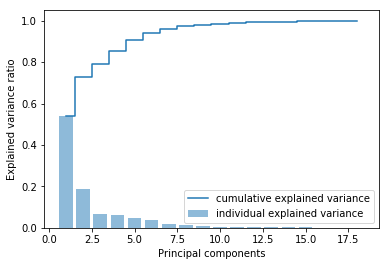

In [56]:
plt.bar(range(1,19), var_explained, alpha=0.5, align='center', label='individual explained variance')
plt.step(range(1,19),cum_var_exp, where= 'mid', label='cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.legend(loc = 'best')
plt.show()

In [57]:
# From graph we find that most of the information are contained in first 6 Principal Components
# P_reduce represents reduced mathematical space....

P_reduce = np.array(eigvectors_sorted[0:6])   # Reducing from 18 to 6 dimension space

X_std_6D = np.dot(X_std,P_reduce.T)   # projecting original data into principal component dimensions

Proj_data_df = pd.DataFrame(X_std_6D)  # converting array to dataframe for pairplot

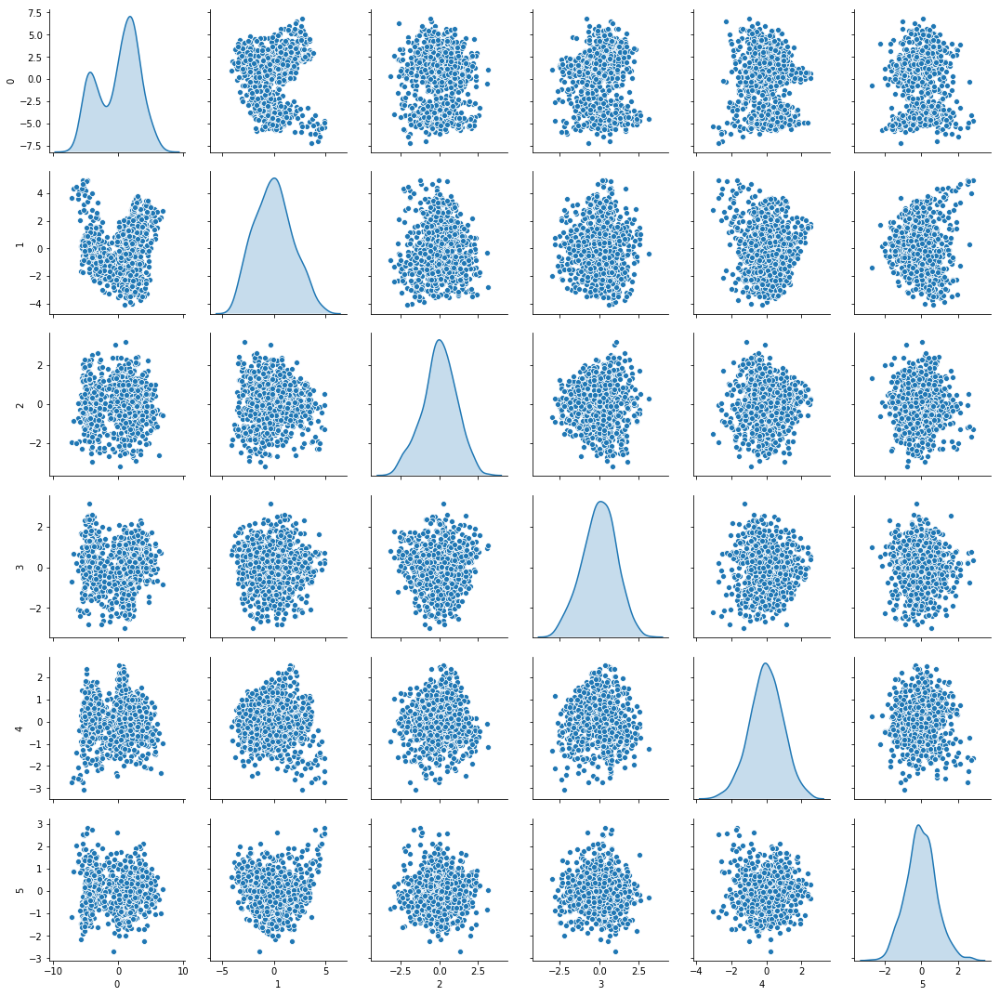

In [58]:
#Let us check it visually


sns.pairplot(Proj_data_df, diag_kind='kde') 

In [59]:
# As expected now the spread of the off diagonal data points in the mathematical space is almost spherical

In [60]:
from sklearn import model_selection

test_size = 0.30 # taking 70:30 training and test set
seed = 7  # Random numbmer seeding for reapeatability of the code
X_train, X_test, y_train, y_test = model_selection.train_test_split(Proj_data_df, y, test_size=test_size, random_state=seed)

In [61]:
## We will use the Naive Bayes & Support Vector Classifiers

In [62]:
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

In [63]:

#Grid search to tune model parameters for SVC
from sklearn.model_selection import GridSearchCV

model = SVC()

params = {'C': [0.01, 0.1, 0.5, 1], 'kernel': ['linear', 'rbf']}

model1 = GridSearchCV(model, param_grid=params, verbose=5)

model1.fit(X_train, y_train)

print("Best Hyper Parameters:\n", model1.best_params_)

C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
C:\Users\Asus\Ana

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.7878787878787878, total=   0.0s
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.7575757575757576, total=   0.0s
[CV] C=0.01, kernel=linear ...........................................
[CV] ... C=0.01, kernel=linear, score=0.826530612244898, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ....... C=0.01, kernel=rbf, score=0.51010101010101, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ....... C=0.01, kernel=rbf, score=0.51010101010101, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ..... C=0.01, kernel=rbf, score=0.5102040816326531, total=   0.0s
[CV] C=0.1, kernel=linear ............................................
[CV] ... C=0.1, k

C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished
C:\Users\Asu

In [64]:
# Best Hyper Parameters:
# {'C': 1, 'kernel': 'rbf'}

In [65]:
# calculate accuracy measures and confusion matrix
from sklearn import metrics

In [66]:
#Build the model with the best hyper parameters
svc_model = SVC(C=1, kernel="rbf")

# Fitting the mode
svc_model.fit(X_train, y_train)

#Prediction on test set
prediction = svc_model.predict(X_test)

# Accuracy on test set
accuracy =  svc_model.score(X_test, y_test)
expected=y_test
print("Classification report")
print(metrics.classification_report(expected, prediction))
print("Confusion matrix")
print(metrics.confusion_matrix(expected, prediction))
print("Overall score ",accuracy)

Classification report
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        66
           1       0.96      0.92      0.94       127
           2       0.86      0.93      0.90        61

   micro avg       0.94      0.94      0.94       254
   macro avg       0.93      0.94      0.94       254
weighted avg       0.94      0.94      0.94       254

Confusion matrix
[[ 64   2   0]
 [  1 117   9]
 [  1   3  57]]
Overall score  0.937007874015748


C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


In [67]:
# We get an overall score of 93.7% with a good recall value

In [68]:
model = GaussianNB()
iterationList=np.random.randint(1,100,10)
itr = 1
for i in iterationList:
    seed = i
    X_train, X_test, y_train, y_test = model_selection.train_test_split(Proj_data_df, y, test_size=test_size, random_state=seed)
    # Fitting the mode
    model.fit(X_train, y_train)
    #Prediction on test set
    prediction = model.predict(X_test)
    # Accuracy on test set
    accuracy =  model.score(X_test, y_test)
    expected=y_test
    print("Iteration ",itr)
    itr=itr+1
    print()
    print("data split random state ",seed)
    print("Classification report")
    print(metrics.classification_report(expected, prediction))
    print("Confusion matrix")
    print(metrics.confusion_matrix(expected, prediction))
    print("Overall score ",accuracy)
    print("----------------------------------------------------")

Iteration  1

data split random state  57
Classification report
              precision    recall  f1-score   support

           0       0.78      0.55      0.65        65
           1       0.84      0.84      0.84       138
           2       0.54      0.75      0.63        51

   micro avg       0.75      0.75      0.75       254
   macro avg       0.72      0.71      0.71       254
weighted avg       0.77      0.75      0.75       254

Confusion matrix
[[ 36  11  18]
 [  8 116  14]
 [  2  11  38]]
Overall score  0.7480314960629921
----------------------------------------------------
Iteration  2

data split random state  52
Classification report
              precision    recall  f1-score   support

           0       0.71      0.71      0.71        59
           1       0.83      0.80      0.82       135
           2       0.71      0.77      0.74        60

   micro avg       0.77      0.77      0.77       254
   macro avg       0.75      0.76      0.75       254
weighted avg   

In [69]:
# For Naive Bayes we get a highest overall score of 79% for data split random state = 36

# Now increasing principal components form 6 to 9

In [70]:
P_reduce = np.array(eigvectors_sorted[0:9])   # increasing from 6 to 9 dimension space

X_std_9D = np.dot(X_std,P_reduce.T)   # projecting original data into principal component dimensions

Proj_data_df = pd.DataFrame(X_std_9D)  # converting array to dataframe for pairplot

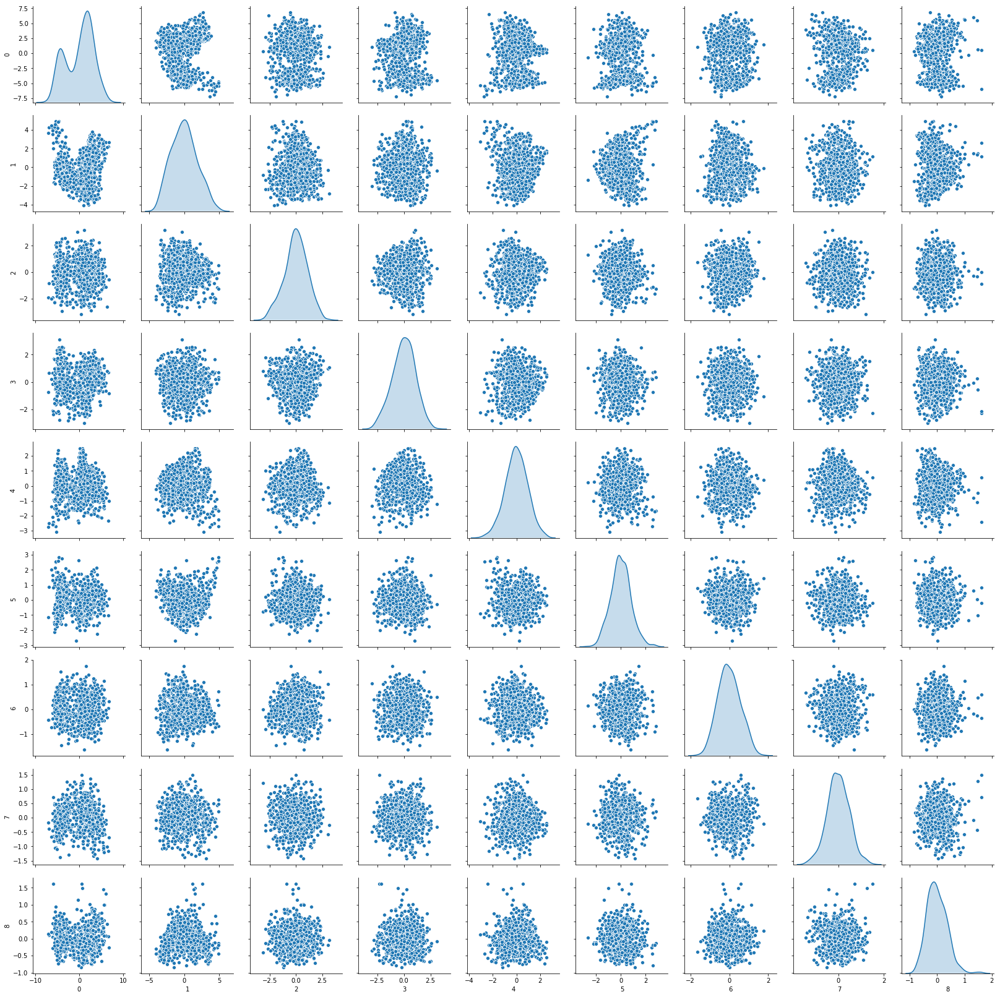

In [71]:
sns.pairplot(Proj_data_df, diag_kind='kde') 

In [72]:
from sklearn import model_selection

test_size = 0.30 # taking 70:30 training and test set
seed = 7  # Random numbmer seeding for reapeatability of the code
X_train, X_test, y_train, y_test = model_selection.train_test_split(Proj_data_df, y, test_size=test_size, random_state=seed)

In [73]:
#Grid search to tune model parameters for SVC
from sklearn.model_selection import GridSearchCV

model = SVC()

params = {'C': [0.01, 0.1, 0.5, 1], 'kernel': ['linear', 'rbf']}

model1 = GridSearchCV(model, param_grid=params, verbose=5)

model1.fit(X_train, y_train)

print("Best Hyper Parameters:\n", model1.best_params_)

C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
C:\Users\Asus\Ana

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.8333333333333334, total=   0.0s
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.8232323232323232, total=   0.0s
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.8622448979591837, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ....... C=0.01, kernel=rbf, score=0.51010101010101, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ....... C=0.01, kernel=rbf, score=0.51010101010101, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ..... C=0.01, kernel=rbf, score=0.5102040816326531, total=   0.0s
[CV] C=0.1, kernel=linear ............................................
[CV] ... C=0.1, k

C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.1s finished
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


In [74]:
# Best Hyper Parameters:
 # {'C': 0.5, 'kernel': 'rbf'}

In [75]:
#Build the model with the best hyper parameters
svc_model = SVC(C=0.5, kernel="rbf")

# Fitting the mode
svc_model.fit(X_train, y_train)

#Prediction on test set
prediction = svc_model.predict(X_test)

# Accuracy on test set
accuracy =  svc_model.score(X_test, y_test)
expected=y_test
print("Classification report")
print(metrics.classification_report(expected, prediction))
print("Confusion matrix")
print(metrics.confusion_matrix(expected, prediction))
print("Overall score ",accuracy)

Classification report
              precision    recall  f1-score   support

           0       0.97      0.98      0.98        66
           1       0.98      0.98      0.98       127
           2       0.97      0.93      0.95        61

   micro avg       0.97      0.97      0.97       254
   macro avg       0.97      0.97      0.97       254
weighted avg       0.97      0.97      0.97       254

Confusion matrix
[[ 65   1   0]
 [  0 125   2]
 [  2   2  57]]
Overall score  0.9724409448818898


C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


In [76]:
# The overall score increased to 97.2% when dimensions are increased from 6 to 9

In [77]:
model = GaussianNB()
iterationList=np.random.randint(1,100,10)
itr = 1
for i in iterationList:
    seed = i
    X_train, X_test, y_train, y_test = model_selection.train_test_split(Proj_data_df, y, test_size=test_size, random_state=seed)
    # Fitting the mode
    model.fit(X_train, y_train)
    #Prediction on test set
    prediction = model.predict(X_test)
    # Accuracy on test set
    accuracy =  model.score(X_test, y_test)
    expected=y_test
    print("Iteration ",itr)
    itr=itr+1
    print()
    print("data split random state ",seed)
    print("Classification report")
    print(metrics.classification_report(expected, prediction))
    print("Confusion matrix")
    print(metrics.confusion_matrix(expected, prediction))
    print("Overall score ",accuracy)
    print("----------------------------------------------------")

Iteration  1

data split random state  83
Classification report
              precision    recall  f1-score   support

           0       0.90      0.72      0.80        75
           1       0.87      0.94      0.91       123
           2       0.75      0.82      0.79        56

   micro avg       0.85      0.85      0.85       254
   macro avg       0.84      0.83      0.83       254
weighted avg       0.85      0.85      0.85       254

Confusion matrix
[[ 54   8  13]
 [  5 116   2]
 [  1   9  46]]
Overall score  0.8503937007874016
----------------------------------------------------
Iteration  2

data split random state  3
Classification report
              precision    recall  f1-score   support

           0       0.82      0.76      0.79        71
           1       0.88      0.87      0.88       123
           2       0.73      0.82      0.77        60

   micro avg       0.83      0.83      0.83       254
   macro avg       0.81      0.82      0.81       254
weighted avg    

In [78]:
# Now we get highest score Naive Bayes for random state 11 with overall score of 85%

# Using all the principal components

In [79]:
P_reduce = np.array(eigvectors_sorted)   # taking all the dimensions

X_std_all = np.dot(X_std,P_reduce.T)   # projecting original data into principal component dimensions

Proj_data_df = pd.DataFrame(X_std_all)  # converting array to dataframe for pairplot

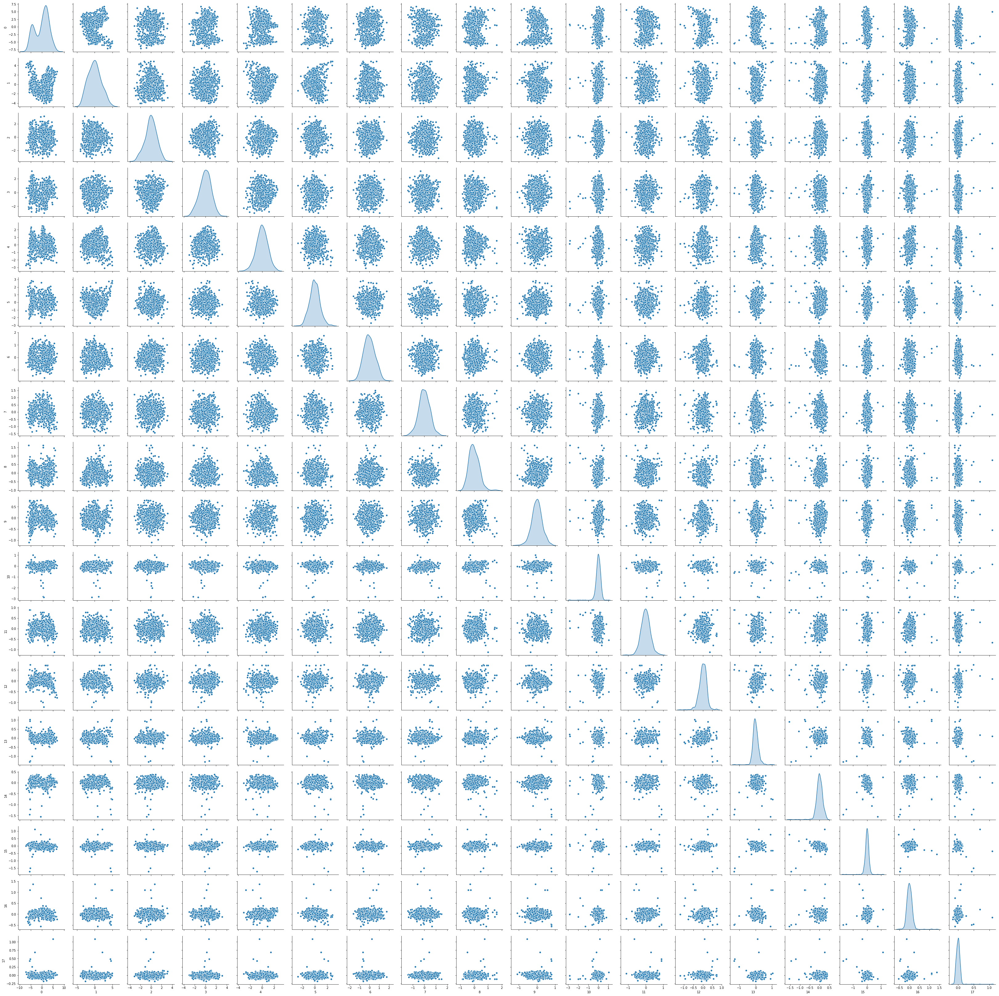

In [80]:
sns.pairplot(Proj_data_df, diag_kind='kde') 

In [81]:
from sklearn import model_selection

test_size = 0.30 # taking 70:30 training and test set
seed = 7  # Random numbmer seeding for reapeatability of the code
X_train, X_test, y_train, y_test = model_selection.train_test_split(Proj_data_df, y, test_size=test_size, random_state=seed)

In [82]:
#Grid search to tune model parameters for SVC
from sklearn.model_selection import GridSearchCV

model = SVC()

params = {'C': [0.01, 0.1, 0.5, 1], 'kernel': ['linear', 'rbf']}

model1 = GridSearchCV(model, param_grid=params, verbose=5)

model1.fit(X_train, y_train)

print("Best Hyper Parameters:\n", model1.best_params_)

C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
C:\Users\Asus\Ana

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.8383838383838383, total=   0.0s
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.8232323232323232, total=   0.0s
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.8826530612244898, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ....... C=0.01, kernel=rbf, score=0.51010101010101, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ....... C=0.01, kernel=rbf, score=0.51010101010101, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ..... C=0.01, kernel=rbf, score=0.5102040816326531, total=   0.0s
[CV] C=0.1, kernel=linear ............................................
[CV] ... C=0.1, k

C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: 

In [83]:
#Build the model with the best hyper parameters
svc_model = SVC(C=1, kernel="rbf")

# Fitting the mode
svc_model.fit(X_train, y_train)

#Prediction on test set
prediction = svc_model.predict(X_test)

# Accuracy on test set
accuracy =  svc_model.score(X_test, y_test)
expected=y_test
print("Classification report")
print(metrics.classification_report(expected, prediction))
print("Confusion matrix")
print(metrics.confusion_matrix(expected, prediction))
print("Overall score ",accuracy)

Classification report
              precision    recall  f1-score   support

           0       0.97      0.98      0.98        66
           1       0.98      0.98      0.98       127
           2       0.97      0.97      0.97        61

   micro avg       0.98      0.98      0.98       254
   macro avg       0.97      0.98      0.97       254
weighted avg       0.98      0.98      0.98       254

Confusion matrix
[[ 65   1   0]
 [  1 124   2]
 [  1   1  59]]
Overall score  0.9763779527559056


C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


In [85]:
# The overall score is 97.6 % . This is almost near to the score that we get while choosing only 9 dimensions, which shows that most of the information are stored in the first 9 principal components chosen earlier

In [86]:
model = GaussianNB()
iterationList=np.random.randint(1,100,10)
itr = 1
for i in iterationList:
    seed = i
    X_train, X_test, y_train, y_test = model_selection.train_test_split(Proj_data_df, y, test_size=test_size, random_state=seed)
    # Fitting the mode
    model.fit(X_train, y_train)
    #Prediction on test set
    prediction = model.predict(X_test)
    # Accuracy on test set
    accuracy =  model.score(X_test, y_test)
    expected=y_test
    print("Iteration ",itr)
    itr=itr+1
    print()
    print("data split random state ",seed)
    print("Classification report")
    print(metrics.classification_report(expected, prediction))
    print("Confusion matrix")
    print(metrics.confusion_matrix(expected, prediction))
    print("Overall score ",accuracy)
    print("----------------------------------------------------")

Iteration  1

data split random state  41
Classification report
              precision    recall  f1-score   support

           0       0.88      0.73      0.80        70
           1       0.84      0.95      0.89       131
           2       0.86      0.79      0.82        53

   micro avg       0.85      0.85      0.85       254
   macro avg       0.86      0.82      0.84       254
weighted avg       0.86      0.85      0.85       254

Confusion matrix
[[ 51  14   5]
 [  5 124   2]
 [  2   9  42]]
Overall score  0.8543307086614174
----------------------------------------------------
Iteration  2

data split random state  65
Classification report
              precision    recall  f1-score   support

           0       0.90      0.68      0.77        68
           1       0.82      0.93      0.88       121
           2       0.80      0.82      0.81        65

   micro avg       0.83      0.83      0.83       254
   macro avg       0.84      0.81      0.82       254
weighted avg   

In [87]:
# The highest score obtained from Naive Bayes this time is 87% for random state = 29

# If we dont use PCA then what we get :-

In [88]:
# SVC
test_size = 0.30 # taking 70:30 training and test set
seed = 7  # Random numbmer seeding for reapeatability of the code
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=test_size, random_state=seed)
#Grid search to tune model parameters for SVC
from sklearn.model_selection import GridSearchCV

model = SVC()

params = {'C': [0.01, 0.1, 0.5, 1], 'kernel': ['linear', 'rbf']}

model1 = GridSearchCV(model, param_grid=params, verbose=5)

model1.fit(X_train, y_train)

print("Best Hyper Parameters:\n", model1.best_params_)

C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
C:\Users\Asus\Ana

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.9191919191919192, total=   0.0s
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.9040404040404041, total=   0.0s
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.9489795918367347, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ....... C=0.01, kernel=rbf, score=0.51010101010101, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ....... C=0.01, kernel=rbf, score=0.51010101010101, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ..... C=0.01, kernel=rbf, score=0.5102040816326531, total=   0.0s
[CV] C=0.1, kernel=linear ............................................
[CV] ... C=0.1, k

C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


[CV] ...... C=0.1, kernel=rbf, score=0.5102040816326531, total=   0.0s
[CV] C=0.5, kernel=linear ............................................
[CV] ... C=0.5, kernel=linear, score=0.9393939393939394, total=   0.0s
[CV] C=0.5, kernel=linear ............................................
[CV] ... C=0.5, kernel=linear, score=0.8939393939393939, total=   0.0s
[CV] C=0.5, kernel=linear ............................................
[CV] ... C=0.5, kernel=linear, score=0.9183673469387755, total=   0.1s
[CV] C=0.5, kernel=rbf ...............................................
[CV] ........ C=0.5, kernel=rbf, score=0.51010101010101, total=   0.0s
[CV] C=0.5, kernel=rbf ...............................................
[CV] ........ C=0.5, kernel=rbf, score=0.51010101010101, total=   0.0s
[CV] C=0.5, kernel=rbf ...............................................
[CV] ...... C=0.5, kernel=rbf, score=0.5102040816326531, total=   0.0s
[CV] C=1, kernel=linear ..............................................


C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


[CV] ..... C=1, kernel=linear, score=0.9444444444444444, total=   0.3s
[CV] C=1, kernel=linear ..............................................
[CV] ..... C=1, kernel=linear, score=0.8838383838383839, total=   0.0s
[CV] C=1, kernel=linear ..............................................
[CV] ..... C=1, kernel=linear, score=0.9081632653061225, total=   0.1s
[CV] C=1, kernel=rbf .................................................
[CV] .......... C=1, kernel=rbf, score=0.51010101010101, total=   0.0s
[CV] C=1, kernel=rbf .................................................
[CV] .......... C=1, kernel=rbf, score=0.51010101010101, total=   0.0s
[CV] C=1, kernel=rbf .................................................
[CV] ........ C=1, kernel=rbf, score=0.5102040816326531, total=   0.0s
Best Hyper Parameters:
 {'C': 0.01, 'kernel': 'linear'}


C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\Asus\Anaconda3\lib\site-packages\sklearn\svm\base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    1.5s finished


In [89]:
#Build the model with the best hyper parameters
svc_model = SVC(C=0.01, kernel="linear")

# Fitting the mode
svc_model.fit(X_train, y_train)

#Prediction on test set
prediction = svc_model.predict(X_test)

# Accuracy on test set
accuracy =  svc_model.score(X_test, y_test)
expected=y_test
print("Classification report")
print(metrics.classification_report(expected, prediction))
print("Confusion matrix")
print(metrics.confusion_matrix(expected, prediction))
print("Overall score ",accuracy)

Classification report
              precision    recall  f1-score   support

           0       0.90      0.91      0.90        66
           1       0.93      0.94      0.93       127
           2       0.98      0.95      0.97        61

   micro avg       0.93      0.93      0.93       254
   macro avg       0.94      0.93      0.93       254
weighted avg       0.93      0.93      0.93       254

Confusion matrix
[[ 60   6   0]
 [  7 119   1]
 [  0   3  58]]
Overall score  0.9330708661417323


In [90]:
# Taking all the independent variables we do SVC and find the overall score as 93% which is less than the score that we get when we use PCA.

In [91]:
model = GaussianNB()
iterationList=np.random.randint(1,100,10)
itr = 1
for i in iterationList:
    seed = i
    X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=test_size, random_state=seed)
    # Fitting the mode
    model.fit(X_train, y_train)
    #Prediction on test set
    prediction = model.predict(X_test)
    # Accuracy on test set
    accuracy =  model.score(X_test, y_test)
    expected=y_test
    print("Iteration ",itr)
    itr=itr+1
    print()
    print("data split random state ",seed)
    print("Classification report")
    print(metrics.classification_report(expected, prediction))
    print("Confusion matrix")
    print(metrics.confusion_matrix(expected, prediction))
    print("Overall score ",accuracy)
    print("----------------------------------------------------")

Iteration  1

data split random state  76
Classification report
              precision    recall  f1-score   support

           0       0.94      0.24      0.38        71
           1       0.84      0.65      0.73       125
           2       0.38      0.91      0.54        58

   micro avg       0.59      0.59      0.59       254
   macro avg       0.72      0.60      0.55       254
weighted avg       0.76      0.59      0.59       254

Confusion matrix
[[17 12 42]
 [ 0 81 44]
 [ 1  4 53]]
Overall score  0.594488188976378
----------------------------------------------------
Iteration  2

data split random state  58
Classification report
              precision    recall  f1-score   support

           0       0.95      0.25      0.40        80
           1       0.81      0.66      0.72       122
           2       0.37      0.96      0.54        52

   micro avg       0.59      0.59      0.59       254
   macro avg       0.71      0.62      0.55       254
weighted avg       0.76  

In [92]:
# The highest score for this Naive Bayes without PCA is 67% which is very less compared to the results that we get when we use PCA.

# Conclusions:-

From the Principal Component Analysis we come to know that optimum number of dimensions that can be used for building a model is 9 , the same we get from the summary plot of eigen values sorted in descending order. Again from SVC and Naive Bayes we find that there is some considerable increase in the model performance/score when the dimensions are increased from 6 (93%) to 9 (97%). However the increase in performance is very low or almost negligible when all the 18 dimensions are taken into consideration. Also we noticed that the performance of model drops significantly when we dont use PCA. Hence from this project we infer that when there is a strong correlation among the independent variables/dimensions then PCA is the best choice as it helps to captures the covariance information and helps us to choose optimum number of dimensions resulting in increase in model performance.